In [1]:
import numpy as np
import cv2
import json
from pathlib import Path

import matplotlib.pyplot as plt

In [2]:
abs_path = Path("/Users/stimpfli/Desktop/map_muscles/map_muscles/calibration")
calibration_file = abs_path / 'calibration_parameters.json'
with open(calibration_file, 'r') as f:
    calib = json.load(f)

F = np.array(calib['F'])
e_muscle = np.array((calib['e_muscle']))
e_kin = np.array(calib['e_kin'])
muscle_kin_ratio = np.array(calib['muscle_kin_ratio'])
ref_kin_pts = np.array(calib['ref_kin_pts'])
ref_muscle_pts = np.array(calib['ref_muscle_pts'])

In [3]:
def transferPtsToMuscle(img_muscle, img_kin, lines, pts, draw_line=True):
    ''' img_line - image on which we draw the epilines for the points in img_pts
        lines - corresponding epilines '''
    
    r,c = img_muscle.shape
    img_lines = cv2.cvtColor(img_muscle,cv2.COLOR_GRAY2BGR)
    img_pts = cv2.cvtColor(img_kin,cv2.COLOR_GRAY2BGR)

    pts_dist = np.linalg.norm(pts-e_kin[:2], axis=-1)
    line_pts_dist = pts_dist * muscle_kin_ratio
    epitope = e_muscle[:2]
    ref_pts = ref_kin_pts
    ref_line_pts = ref_muscle_pts
    
    ref_pts_dist = []
    for pt in pts:
        ref_pts_dist.append(np.linalg.norm(ref_pts-pt, axis=-1))
    ref_pts_dist = np.array(ref_pts_dist)
    #ref_pts_dist_ratio = ref_pts_dist[0]/ref_pts_dist[1]

    assert len(lines) == len(pts) == len(line_pts_dist)
    
    # now find the point on the line that is line_pts_dist away from the epitope
    for r, pt2, line_pt_dist, ref_pt_dist_ratio in zip(lines, pts, line_pts_dist, ref_pts_dist):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        if draw_line:
            img_lines = cv2.line(img_lines, (x0,y0), (x1,y1), color, 2)
        line_vect = np.array([x1-x0, y1-y0])
        line_vect = line_vect/np.linalg.norm(line_vect)
        final_pt_pos = np.round(epitope + line_vect*line_pt_dist).astype(int)
        final_pt_neg = np.round(epitope - line_vect*line_pt_dist).astype(int)

        # Compute the distance to two reference points (if it is the right point, ration should be conserved)
        ref_line_pts_dist_pos = np.linalg.norm(ref_line_pts-final_pt_pos, axis=-1)
        ref_line_pts_dist_neg = np.linalg.norm(ref_line_pts-final_pt_neg, axis=-1)
        #ref_line_pts_dist_ratio_pos = ref_line_pts_dist_pos[0]/ref_line_pts_dist_pos[1]
        #ref_line_pts_dist_ratio_neg = ref_line_pts_dist_neg[0]/ref_line_pts_dist_neg[1]

        #ratio_distance = np.abs([ref_line_pts_dist_ratio_pos-ref_pt_dist_ratio,
        #                             ref_line_pts_dist_ratio_neg-ref_pt_dist_ratio])
        
        dist_ratio_pos_std = np.std(ref_line_pts_dist_pos/ref_pt_dist_ratio)
        dist_ratio_neg_std = np.std(ref_line_pts_dist_neg/ref_pt_dist_ratio)

        final_pt = final_pt_pos if dist_ratio_pos_std < dist_ratio_neg_std else final_pt_neg
        img_lines = cv2.circle(img_lines, tuple(final_pt), 10, color, 2)
        img_pts = cv2.circle(img_pts,tuple(pt2),10,color,-1)
    return img_lines, img_pts

In [4]:
def get_interesting_pts(gray, n_pts=10, points_margin=200):
    
    max_kin_pxl = np.max(gray)
    mask_img = cv2.threshold(gray, 0.4*max_kin_pxl, 0.5*max_kin_pxl, cv2.THRESH_BINARY)[1]
    # erode and dilate mask
    kernel = np.ones((2,2),np.uint8)
    mask_img = cv2.erode(mask_img, kernel, iterations=10)
    mask_img = cv2.dilate(mask_img, kernel, iterations=20)
    x, y, w, h = cv2.boundingRect(mask_img)
    x = max(0, x-points_margin)
    y = max(0, y-points_margin)
    w = min(w+2*points_margin, gray.shape[1])
    h = min(h+2*points_margin, gray.shape[0])
    possible_x = np.arange(x, x+w)
    possible_y = np.arange(y, y+h)
    kin_pts = np.vstack([np.random.choice(possible_x, n_pts), np.random.choice(possible_y, n_pts)]).T

    return kin_pts, x, y, w, h

In [5]:
images_folder = abs_path / "data/calib_images"
muscle_images_paths = list(images_folder.glob("muscle_*.jpg"))

n_images = 10
muscle_images_paths = np.random.choice(muscle_images_paths, n_images)

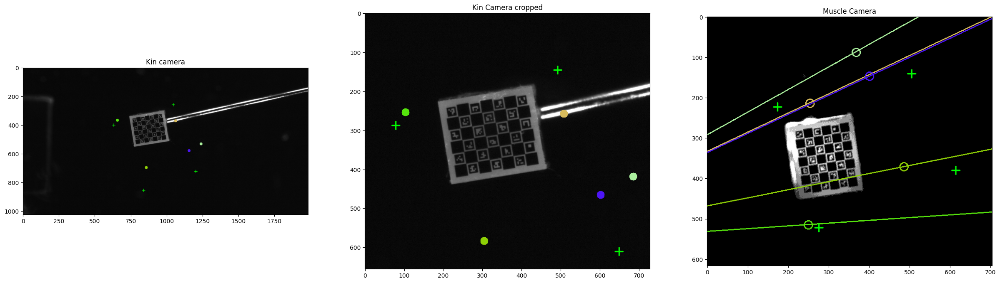

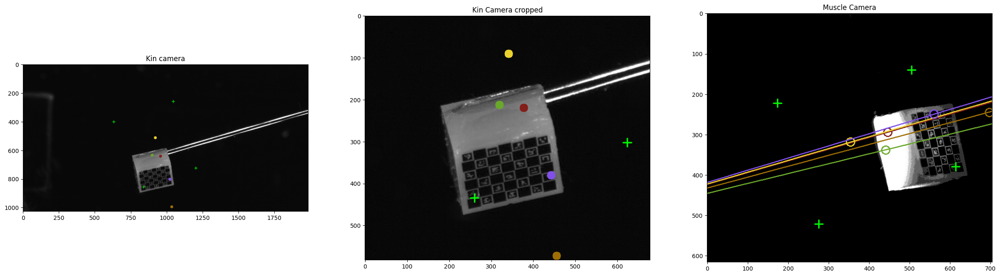

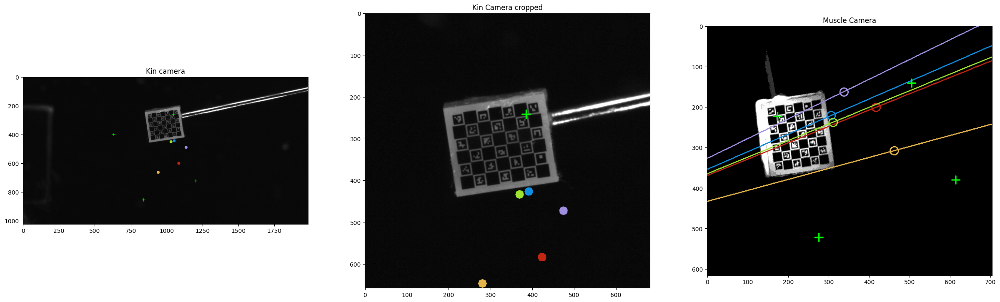

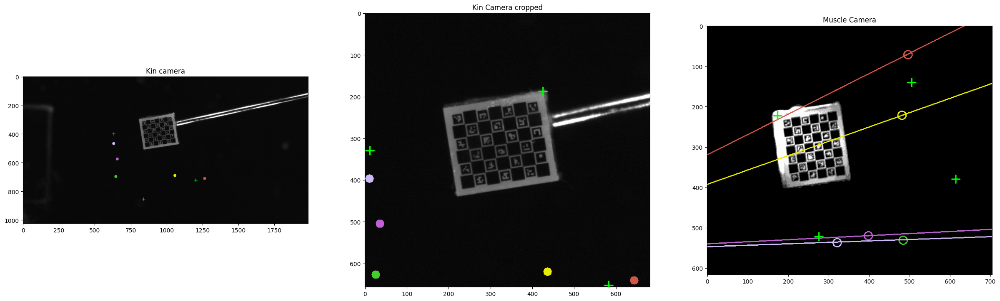

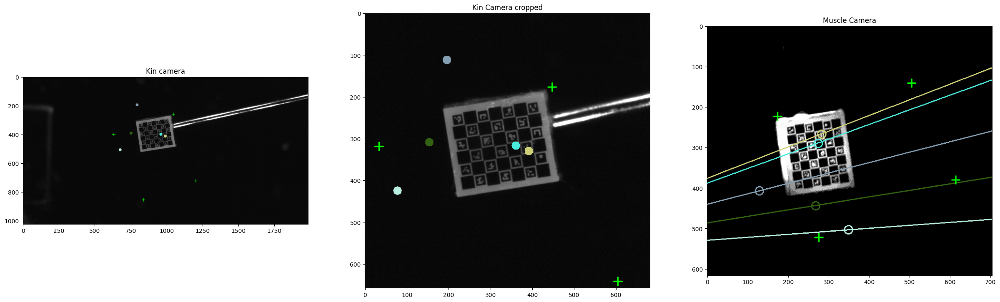

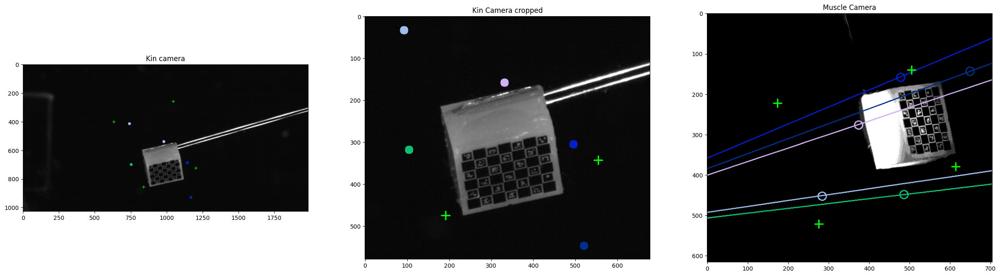

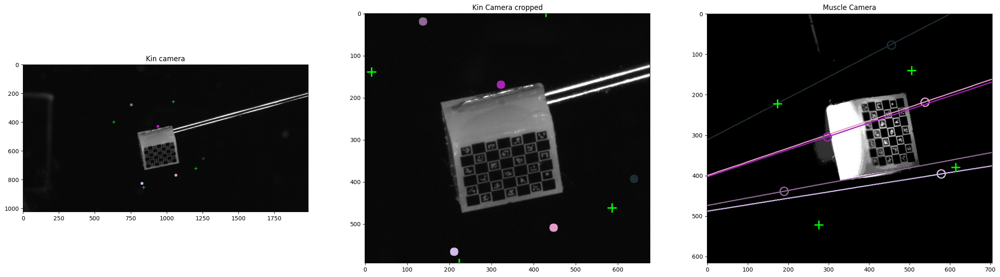

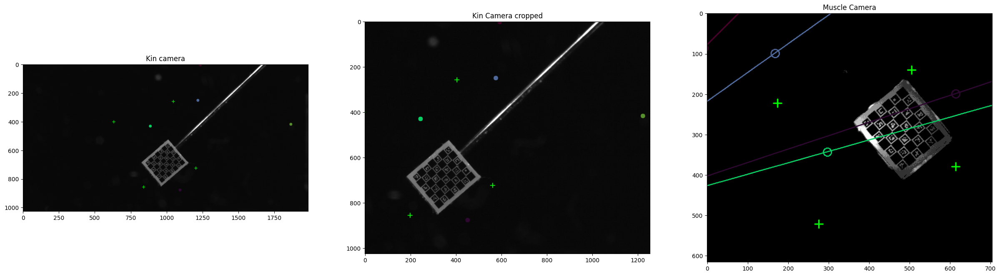

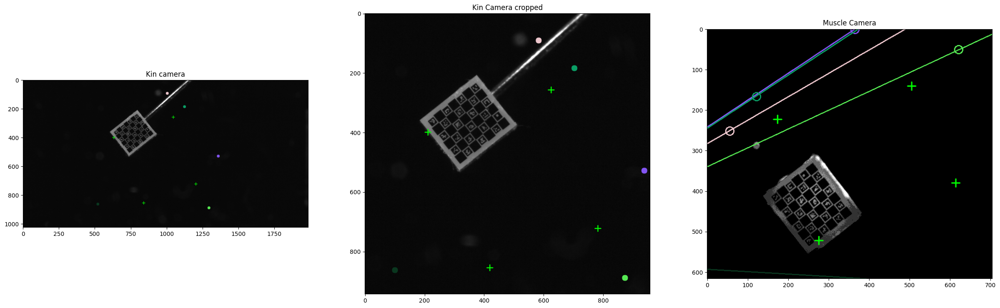

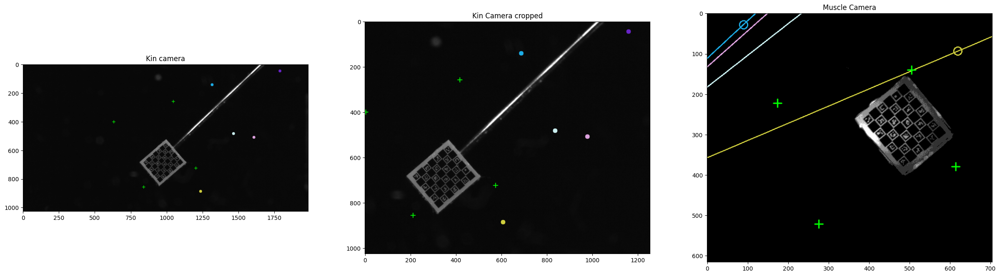

In [6]:
n_pts = 5
points_margin = 200

for muscle_image_path in muscle_images_paths:
    muscle_image = cv2.imread(str(muscle_image_path))
    kin_image_path = images_folder / muscle_image_path.name.replace("muscle", "kinematic")
    kin_image = cv2.imread(str(kin_image_path))

    muscle_image_gray = cv2.cvtColor(muscle_image, cv2.COLOR_BGR2GRAY)
    kin_image_gray = cv2.cvtColor(kin_image, cv2.COLOR_BGR2GRAY)
    
    kin_pts, x, y, w, h  = get_interesting_pts(kin_image_gray, n_pts, points_margin)

    # Find epilines corresponding to points in right image (second image) and
    # drawing its lines on left image
    lines_muscle = cv2.computeCorrespondEpilines(kin_pts.reshape(-1,1,2), 2,F)
    lines_muscle = lines_muscle.reshape(-1,3)
    img_muscle_lines, img_kin_pts = transferPtsToMuscle(muscle_image_gray,kin_image_gray,lines_muscle,kin_pts)

    fig, axs = plt.subplots(1, 3, figsize=(30, 20))

    # draw the epipoles as a cross
    img_kin_pts = cv2.drawMarker(img_kin_pts, tuple(e_kin[:2].astype(int)), color=(255, 0, 0), markerType=cv2.MARKER_CROSS, markerSize=50, thickness=2, line_type=cv2.LINE_AA)
    img_muscle_lines = cv2.drawMarker(img_muscle_lines, tuple(e_muscle[:2].astype(int)), color=(255, 0, 0), markerType=cv2.MARKER_CROSS, markerSize=50, thickness=2, line_type=cv2.LINE_AA)

    # show the reference points
    for ref_kin_pt in ref_kin_pts:
        img_kin_pts = cv2.drawMarker(img_kin_pts, tuple(ref_kin_pt.squeeze().astype(int)), color=(0, 255, 0), markerType=cv2.MARKER_CROSS, markerSize=20, thickness=2, line_type=cv2.LINE_AA)
    for ref_muscle_pt in ref_muscle_pts:
        img_muscle_lines = cv2.drawMarker(img_muscle_lines, tuple(ref_muscle_pt.squeeze().astype(int)), color=(0, 255, 0), markerType=cv2.MARKER_CROSS, markerSize=20, thickness=2, line_type=cv2.LINE_AA)
    
    axs[0].imshow(img_kin_pts, cmap='gray')
    axs[0].set_title("Kin camera")
    
    axs[1].imshow(img_kin_pts[y:y+h, x:x+w])
    axs[1].set_title("Kin Camera cropped")
    axs[2].imshow(img_muscle_lines)
    axs[2].set_title("Muscle Camera")

    plt.show()

In [9]:
from map_muscles.calibration.calibration_utils import draw_corresp_points

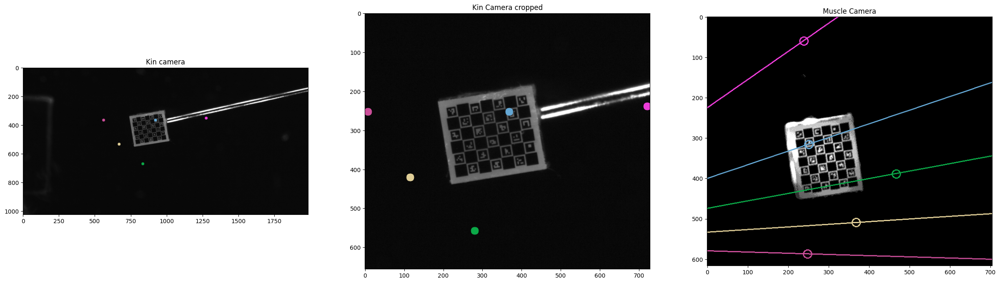

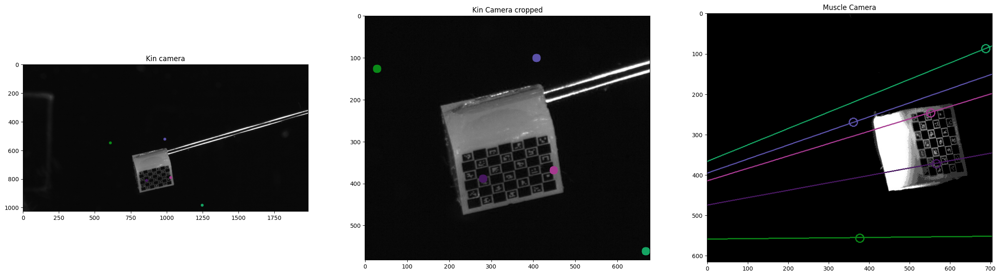

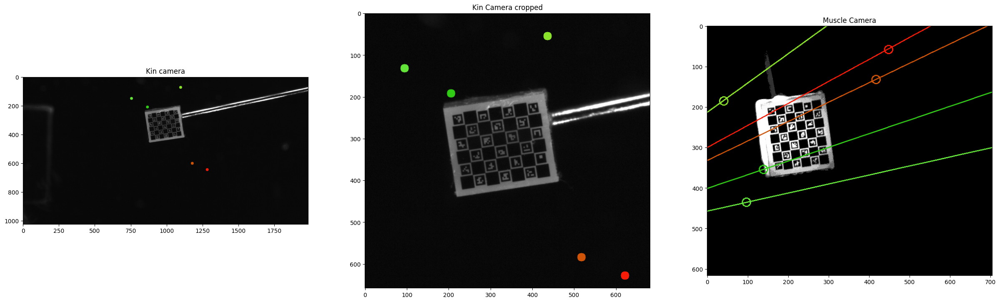

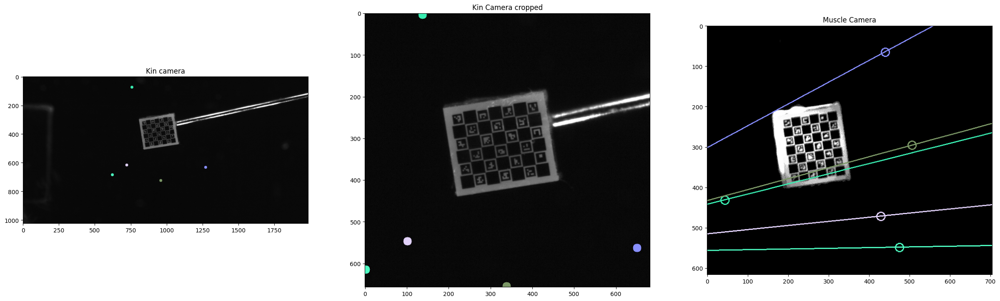

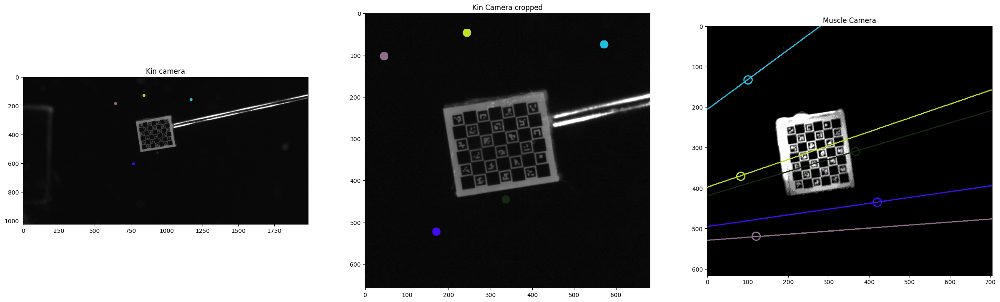

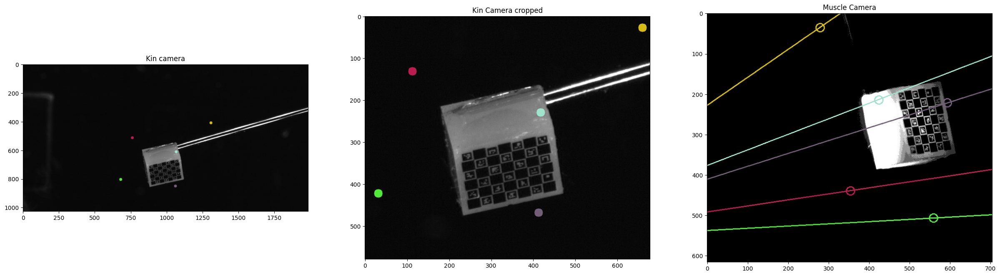

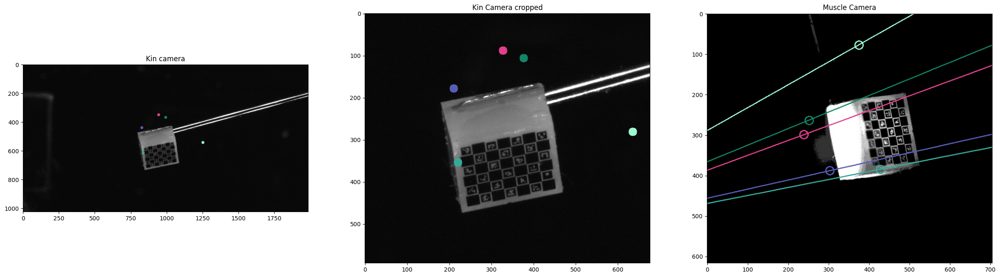

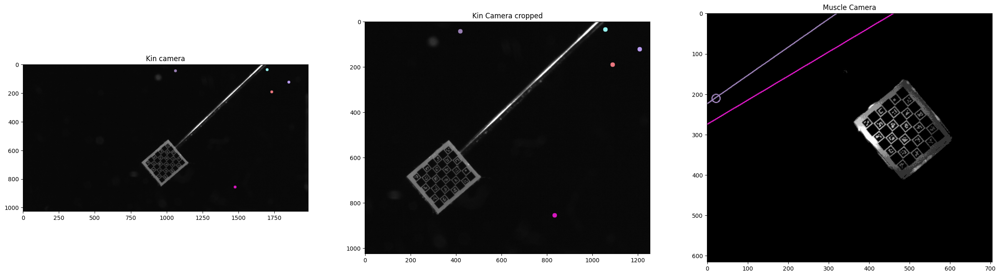

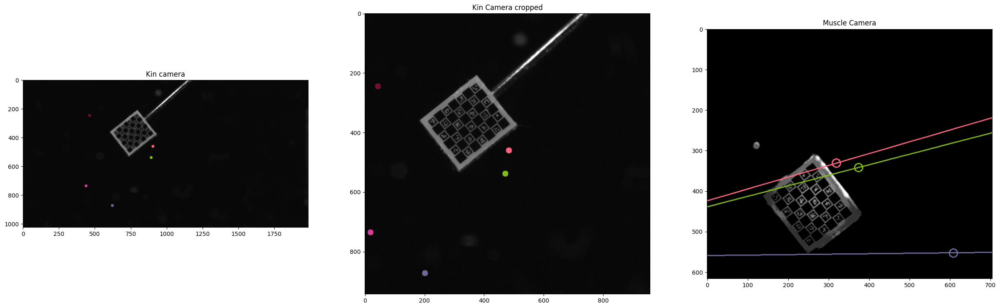

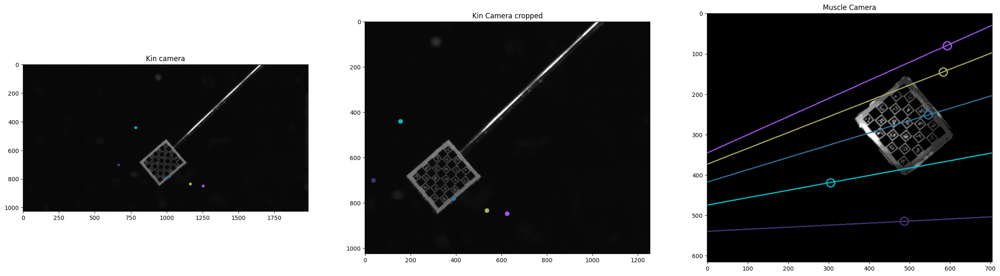

In [10]:
n_pts = 5
points_margin = 200

for muscle_image_path in muscle_images_paths:
    muscle_image = cv2.imread(str(muscle_image_path))
    kin_image_path = images_folder / muscle_image_path.name.replace("muscle", "kinematic")
    kin_image = cv2.imread(str(kin_image_path))

    muscle_image_gray = cv2.cvtColor(muscle_image, cv2.COLOR_BGR2GRAY)
    kin_image_gray = cv2.cvtColor(kin_image, cv2.COLOR_BGR2GRAY)
    
    kin_pts, x, y, w, h  = get_interesting_pts(kin_image_gray, n_pts, points_margin)

    img_kin_pts, img_muscle_lines = draw_corresp_points(kin_pts, kin_image_gray, muscle_image_gray)

    fig, axs = plt.subplots(1, 3, figsize=(30, 20))
    axs[0].imshow(img_kin_pts, cmap='gray')
    axs[0].set_title("Kin camera")
    
    axs[1].imshow(img_kin_pts[y:y+h, x:x+w])
    axs[1].set_title("Kin Camera cropped")
    axs[2].imshow(img_muscle_lines)
    axs[2].set_title("Muscle Camera")

    plt.show()